# Pyleecan Basics

이 노트북은 [Green Forge Coop](https://www.linkedin.com/company/greenforgecoop/about/)에서 주최한 3개의 웨비나 중 첫 번째 웨비나를 바탕으로 만들어졌습니다.

이 웨비나는 녹화되었으며 비디오는 [pyleecan.org](https://pyleecan.org/webinar_1.html)에서 볼 수 있습니다.

**경고**: 이 파일은 pyleecan 1.3.7 및 SciDataTool 1.4.24를 사용했습니다. github상에서 업데이트로 인해 업로드된 버전을 다운로드받은 경우 호환성에 문제가 발생할 수 있습니다. 

In [1]:
from datetime import date
print("Running date:", date.today().strftime("%B %d, %Y"))
import pyleecan
print("Pyleecan version:" + pyleecan.__version__)
import SciDataTool
print("SciDataTool version:" + SciDataTool.__version__)


Running date: June 30, 2022
Pyleecan version:1.3.8
SciDataTool version:2.0.6


In [2]:
# 해석모델 불러오기
from os.path import join
from pyleecan.Functions.load import load
from pyleecan.definitions import DATA_DIR

Toyota_Prius = load(join(DATA_DIR, "Machine", "Toyota_Prius.json"))
Toyota_Prius.plot()

# FEMM 설치 확인
from pyleecan.Classes._FEMMHandler import _FEMMHandler

femm = _FEMMHandler()
femm.openfemm(0)
femm.closefemm()

# 1) 기계를 정의하는 방법 - Machine Class

pyleecan을 사용하는 첫 번째 단계는 머신을 정의하는 것입니다. 이 웨비나는 분산 권선이 있는 **Toyota Prius 2004** 내부 자석 \[1\]의 정의를 보여줍니다.

## Pyleecan이 모델링할 수 있는 기계 유형
Pyleecan은 다음과 같은 주요 2D 방사형 플럭스 기계의 기하학적 모델링을 처리합니다.
- 표면 또는 내부 영구 자석 기계(SPMSM, IPMSM)
- 동기 릴럭턴스 머신(SynRM)
- 다람쥐 유도기 및 이중 급식 유도기(SCIM, DFIM)
- 회전자 동기 기계 및 돌출 극 동기 기계(WSRM)
- 스위치드 릴럭턴스 머신(SRM)

Pyleecan의 아키텍처는 다른 종류의 기계도 정의할 수 있습니다(예: 두 개 이상의 적층 포함). ICEM 2020 pyblation \[2\]에서 더 많은 정보를 얻을 수 있습니다.

모든 머신은 **그래픽 사용자 인터페이스**를 사용하거나 **Python 스크립트**에서 직접 정의할 수 있습니다.

## Pyleecan GUI로 머신 정의하기
GUI는 Pyleecan에서 기계를 정의하는 가장 쉬운 방법입니다. 그 목적은 머신을 생성하거나 로드하고 파이썬 스크립트에 로드할 JSON 형식으로 저장하는 것입니다. 인터페이스를 통해 다음과 같은 기계의 모든 특성을 사용자 친화적인 방식으로 단계별로 정의할 수 있습니다.
- 토폴로지
- 치수
- 재료
- 와인딩

각 매개변수는 툴팁으로 설명되며 설계의 각 단계에서 기계를 미리 볼 수 있습니다.

## GUI 시작
GUI는 노트북에서 다음 명령을 실행하여 시작할 수 있습니다.

Anaconda에서 사용하려면 시스템 변수를 생성해야 합니다.

QT_QPA_PLATFORM_PLUGIN_PATH : 경로\to\anaconda3\Lib\site-packages\PySide2\plugins\platforms

## 머신 로드
GUI에 정의된 머신은 다음 명령으로 로드할 수 있습니다.


In [3]:
# %matplotlib notebook

# Load the machine
from os.path import join
from pyleecan.Functions.load import load
from pyleecan.definitions import DATA_DIR

Toyota_Prius = load(join(DATA_DIR, "Machine", "Toyota_Prius.json"))
Toyota_Prius.plot()

## 스크립팅 모드에서 머신 정의
Pyleecan은 다른 클래스를 사용하여 스크립팅 모드에서 시스템을 정의할 수도 있습니다. 각 클래스는 _pyleecan/Generator/ClasseRef_ 폴더의 csv 파일에서 정의되며 모든 클래스의 문서는 전용 [웹페이지](https://www.pyleecan.org/pyleecan.Classes.html)에서 볼 수 있습니다.
다음 이미지는 머신 클래스 조직을 보여줍니다.

![](https://www.pyleecan.org/_static/machine_classes_UML.png)

모든 회전자와 고정자는 **Lamination** 클래스 또는 딸 중 하나로 생성할 수 있습니다.

![](https://www.pyleecan.org/_static/lamination_classes_UML.png)

스크립팅을 사용하면 다음과 같이 GUI에서 정의할 수 없는 일부 복잡하고 이국적인 시스템을 정의할 수 있습니다.

<IPython.core.display.Javascript object>


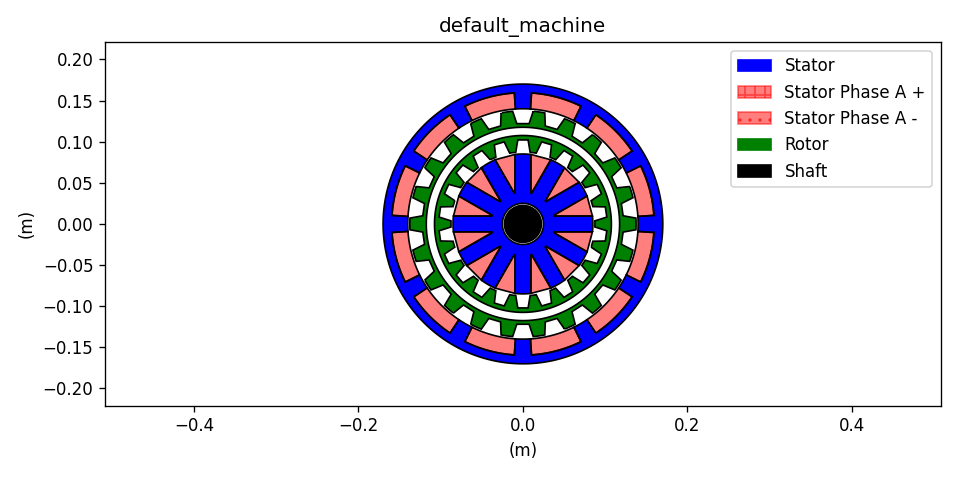

In [281]:
from pyleecan.Classes.MachineUD import MachineUD
from pyleecan.Classes.LamSlotWind import LamSlotWind
from pyleecan.Classes.LamSlot import LamSlot

#from pyleecan.Classes.WindingCW2LT import WindingCW2LT
from pyleecan.Classes.Winding import Winding
from pyleecan.Classes.SlotW10 import SlotW10
from pyleecan.Classes.SlotW22 import SlotW22
from numpy import pi

machine = MachineUD()

# Main geometry parameter
Rext = 170e-3  # Exterior radius of outter lamination
W1 = 30e-3  # Width of first lamination
A1 = 2.5e-3  # Width of the first airgap
W2 = 20e-3
A2 = 10e-3
W3 = 20e-3
A3 = 2.5e-3
W4 = 60e-3

# Outer stator
lam1 = LamSlotWind(Rext=Rext, Rint=Rext - W1, is_internal=False, is_stator=True)
lam1.slot = SlotW22(
    Zs=12, W0=2 * pi / 12 * 0.75, W2=2 * pi / 12 * 0.75, H0=0, H2=W1 * 0.65
)
lam1.winding = Winding(qs=3, p=3)
# Outer rotor
lam2 = LamSlot(
    Rext=lam1.Rint - A1, Rint=lam1.Rint - A1 - W2, is_internal=True, is_stator=False
)
lam2.slot = SlotW10(Zs=22, W0=25e-3, W1=25e-3, W2=15e-3, H0=0, H1=0, H2=W2 * 0.75)
# Inner rotor
lam3 = LamSlot(
    Rext=lam2.Rint - A2,
    Rint=lam2.Rint - A2 - W3,
    is_internal=False,
    is_stator=False,
)
lam3.slot = SlotW10(
    Zs=22, W0=17.5e-3, W1=17.5e-3, W2=12.5e-3, H0=0, H1=0, H2=W3 * 0.75
)
# Inner stator
lam4 = LamSlotWind(
    Rext=lam3.Rint - A3, Rint=lam3.Rint - A3 - W4, is_internal=True, is_stator=True
)
lam4.slot = SlotW10(Zs=12, W0=25e-3, W1=25e-3, W2=1e-3, H0=0, H1=0, H2=W4 * 0.75)
lam4.winding = Winding(qs=3, p=3)
# Machine definition
machine.lam_list = [lam1, lam2, lam3, lam4]

# Plot, check and save
machine.plot()

## 고정자 정의
고정자를 정의하기 위해 다른 매개변수를 사용하여 [**LamSlotWind**](http://pyleecan.org/pyleecan.Classes.LamSlotWind.html) 객체를 초기화합니다. pyleecan에서 모든 매개변수는 SI 단위로 설정해야 합니다.

In [282]:
from pyleecan.Classes.LamSlotWind import LamSlotWind
mm = 1e-3  # Millimeter


# Lamination setup
stator = LamSlotWind(
    Rint=80.95 * mm, # internal radius [m]
    Rext=134.62 * mm, # external radius [m]
    L1=83.82 * mm, # Lamination stack active length [m] without radial ventilation airducts 
                # but including insulation layers between lamination sheets
    Nrvd=0, # Number of radial air ventilation duct
    Kf1=0.95, # Lamination stacking / packing factor
    is_internal=False,
    is_stator=True, 
)

그런 다음 25개의 슬롯 클래스 중 하나인 [**SlotW11**](http://pyleecan.org/pyleecan.Classes.SlotW11.html)을 사용하여 48개의 슬롯을 추가합니다.

<IPython.core.display.Javascript object>


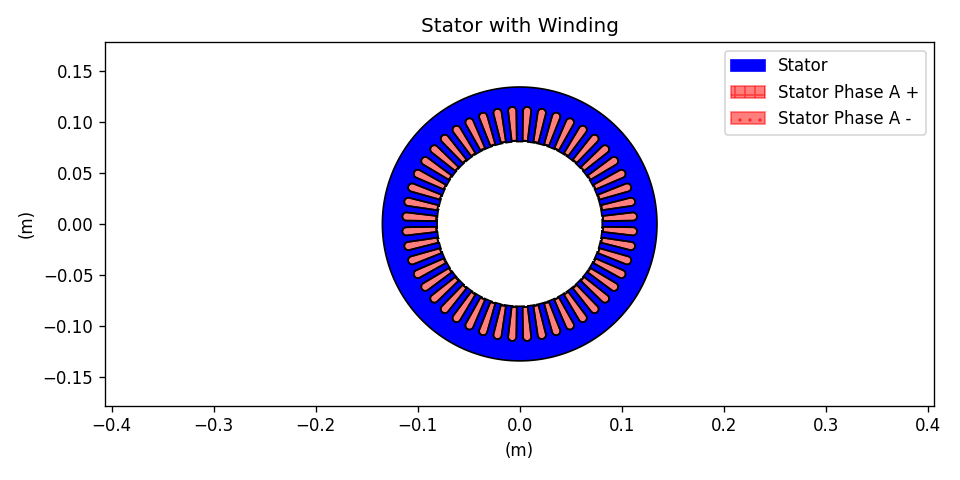

In [283]:
from pyleecan.Classes.SlotW11 import SlotW11

# Slot setup
stator.slot = SlotW11(
    Zs=48, # Slot number
    H0=1.0 * mm,  # Slot isthmus height
    H1=0, # Height
    H2=33.3 * mm, # Slot height below wedge 
    W0=1.93 * mm,  # Slot isthmus width
    W1=5 * mm, # Slot top width
    W2=8 * mm, # Slot bottom width
    R1=4 * mm # Slot bottom radius
)
stator.plot()

슬롯의 경우 [**WindingDW1L**](http://pyleecan.org/pyleecan.Classes.WindingDW1L.html) 및 [**CondType11**](http:/ /pyleecan.org/pyleecan.Classes.CondType11.html). 권선에 대한 규칙은 [pyleecan 웹사이트](https://pyleecan.org/winding.convention.html)에 자세히 설명되어 있습니다. 
-> WindingDW1L Class는 현재 2022.5.6기준 Winding으로 통합됨

<IPython.core.display.Javascript object>


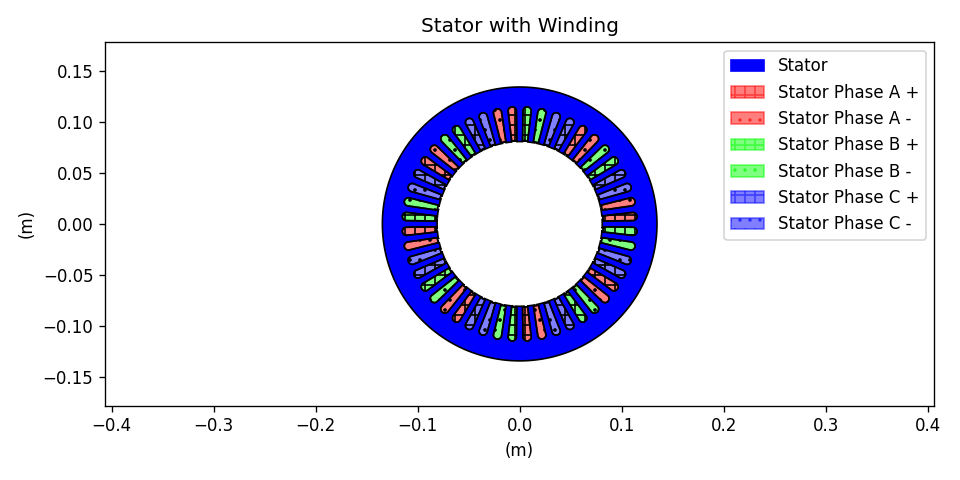

In [284]:
#from pyleecan.Classes.WindingDW1L import WindingDW1L
from pyleecan.Classes.Winding import Winding


from pyleecan.Classes.CondType11 import CondType11
# Winding setup
#stator.winding = WindingDW1L(
stator.winding = Winding(
    qs=3,  # number of phases
    Lewout=0,  # staight length of conductor outside lamination before EW-bend
    p=4,  # number of pole pairs
    Ntcoil=9,  # number of turns per coil
    Npcp=1,  # number of parallel circuits per phase
    Nslot_shift_wind=0,  # 0 not to change the stator winding connection matrix built by pyleecan number 
                         # of slots to shift the coils obtained with pyleecan winding algorithm 
                         # (a, b, c becomes b, c, a with Nslot_shift_wind1=1)
    is_reverse_wind=False # True to reverse the default winding algorithm along the airgap 
                         # (c, b, a instead of a, b, c along the trigonometric direction)
)

# Conductor setup
stator.winding.conductor = CondType11(
    Nwppc_tan=1, # stator winding number of preformed wires (strands) 
                 # in parallel per coil along tangential (horizontal) direction
    Nwppc_rad=1, # stator winding number of preformed wires (strands) 
                 # in parallel per coil along radial (vertical) direction
    Wwire=0.000912, #  single wire width without insulation [m]
    Hwire=2e-3, # single wire height without insulation [m]
    Wins_wire=1e-6, # winding strand insulation thickness [m]
    type_winding_shape=0, # type of winding shape for end winding length calculation
                          # 0 for hairpin windings
                          # 1 for normal windings
)
stator.plot()

## 로터 정의

이 예에서는 [**LamHole**](http://www.pyleecan.org/pyleecan.Classes.LamHole.html) 클래스를 사용하여 회전자를 자석을 포함할 구멍이 있는 적층으로 정의합니다.

고정자와 같은 방식으로 적층을 정의하는 것으로 시작합니다.

In [285]:
from pyleecan.Classes.LamHole import LamHole

# Rotor setup
rotor = LamHole(
    Rint=55.32 * mm, # Internal radius
    Rext=80.2 * mm, # external radius
    is_internal=True, 
    is_stator=False,
    L1=stator.L1 # Lamination stack active length [m] 
                 # without radial ventilation airducts but including insulation layers between lamination sheets
)

그 후 [**HoleM50**](http://www.pyleecan.org/pyleecan.Classes.HoleM50.html) 클래스를 사용하여 회전자에 자석이 있는 구멍을 추가할 수 있습니다.

<IPython.core.display.Javascript object>


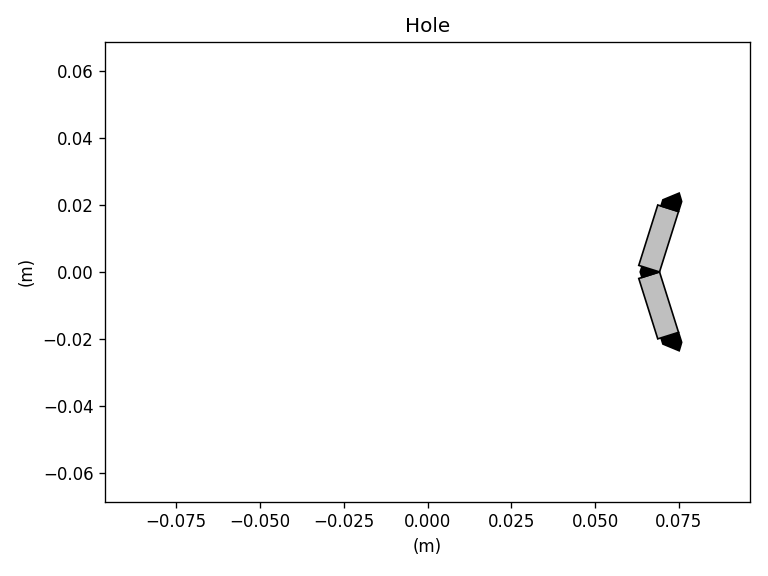

<IPython.core.display.Javascript object>


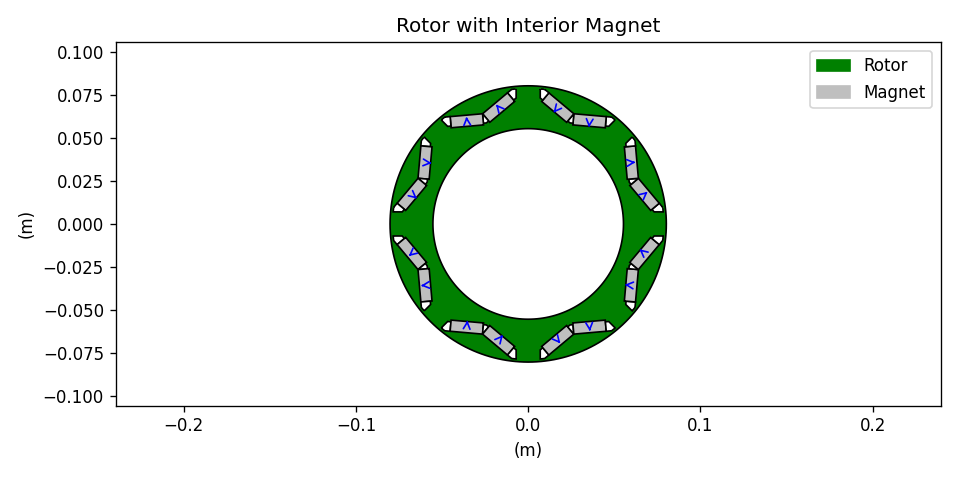

In [286]:
from pyleecan.Classes.HoleM50 import HoleM50
rotor.hole = list()
rotor.hole.append(
    HoleM50(
        Zh=8, # Number of Hole around the circumference
        W0=42.0 * mm,  # Slot opening
        W1=0, # Tooth width (at V bottom)
        W2=0, # Distance Magnet to bottom of the V
        W3=14.0 * mm, # Tooth width (at V top)
        W4=18.9 * mm, # Magnet Width
        H0=10.96 * mm, # Slot Depth
        H1=1.5 * mm, # Distance from the lamination Bore
        H2=1 * mm, # Additional depth for the magnet
        H3=6.5 * mm, # Magnet Height
        H4=0, # Slot top height
    )
)
rotor.hole[0].plot()
rotor.plot()

구멍은 여러 층의 구멍을 생성하거나 다른 종류의 구멍을 결합할 수 있는 목록으로 정의됩니다.

## 샤프트와 프레임 생성

클래스 [**Shaft**](http://www.pyleecan.org/pyleecan.Classes.Shaft.html) 및 [**Frame**](http://www.pyleecan.org/pyleecan.Classes .Frame.html)을 사용하여 기계에 샤프트와 프레임을 추가할 수 있습니다. 이 예에는 프레임이 없습니다.

In [287]:
from pyleecan.Classes.Shaft import Shaft
from pyleecan.Classes.Frame import Frame

# Set shaft
shaft = Shaft(Drsh=rotor.Rint * 2, # Diamater of the rotor shaft [m]
                                   # used to estimate bearing diameter for friction losses
              Lshaft=1.2 # length of the rotor shaft [m] 
             )
frame = None


## 세트 재료 및 자석

모든 Pyleecan 객체는 'save' 메소드를 사용하여 JSON으로 저장할 수 있으며 'load' 기능으로 로드할 수 있습니다.
이 예에서 재료 *M400_50A* 및 *Copper1*이 로드되고 해당 속성에 설정됩니다.

In [288]:
# Loading Materials 
M400_50A = load(join(DATA_DIR, "Material", "M400-50A.json"))
Copper1 = load(join(DATA_DIR, "Material", "Copper1.json"))

# Set Materials
stator.mat_type = M400_50A  # Stator Lamination material
rotor.mat_type = M400_50A  # Rotor Lamination material
stator.winding.conductor.cond_mat = Copper1  # Stator winding conductor material

재료는 스크립팅에서 다른 Pyleecan 객체로 정의할 수도 있습니다. 재료 *Magnet_prius*는 [**Material**](http://www.pyleecan.org/pyleecan.Classes.Material.html) 및 [**MatMagnetics**](http://www .pyleecan.org/pyleecan.Classes.MatMagnetics.html).

In [289]:
from pyleecan.Classes.Material import Material
from pyleecan.Classes.MatMagnetics import MatMagnetics

# Defining magnets
Magnet_prius = Material(name="Magnet_prius")

# Definition of the magnetic properties of the material
Magnet_prius.mag = MatMagnetics(
    mur_lin = 1.05, # Relative magnetic permeability
    Hc = 902181.163126629, # Coercitivity field [A/m]
    alpha_Br = -0.001, # temperature coefficient for remanent flux density /°C compared to 20°C
    Brm20 = 1.24, # magnet remanence induction at 20°C [T]
    Wlam = 0, # lamination sheet width without insulation [m] (0 == not laminated)
)

# Definition of the electric properties of the material 
Magnet_prius.elec.rho = 1.6e-06 # Resistivity at 20°C

# Definition of the structural properties of the material
Magnet_prius.struct.rho = 7500.0 # mass per unit volume [kg/m3]

자석 재료는 "magnet_X" 속성으로 설정됩니다. Pyleecan은 구멍의 각 자석에 대해 서로 다른 자화 또는 재료를 정의할 수 있습니다. 여기서 두 자석은 동일하게 정의됩니다.

In [290]:
# Set magnets in the rotor hole
rotor.hole[0].magnet_0.mat_type = Magnet_prius
rotor.hole[0].magnet_1.mat_type = Magnet_prius
rotor.hole[0].magnet_0.type_magnetization = 1
rotor.hole[0].magnet_1.type_magnetization = 1

## 머신 생성, 저장 및 플롯
마지막으로 Machine 객체는 [**MachineIPMSM**](http://www.pyleecan.org/pyleecan.Classes.MachineIPMSM.html)을 사용하여 생성하고 `save' 메소드를 사용하여 저장할 수 있습니다.

DEBUG:matplotlib.pyplot:Loaded backend nbAgg version unknown.


[13:30:40] Saving MachineIPMSM to file 'IPMSM_Toyota_Prius_2004.json'.
Saving MachineIPMSM to file 'IPMSM_Toyota_Prius_2004.json'.


<IPython.core.display.Javascript object>


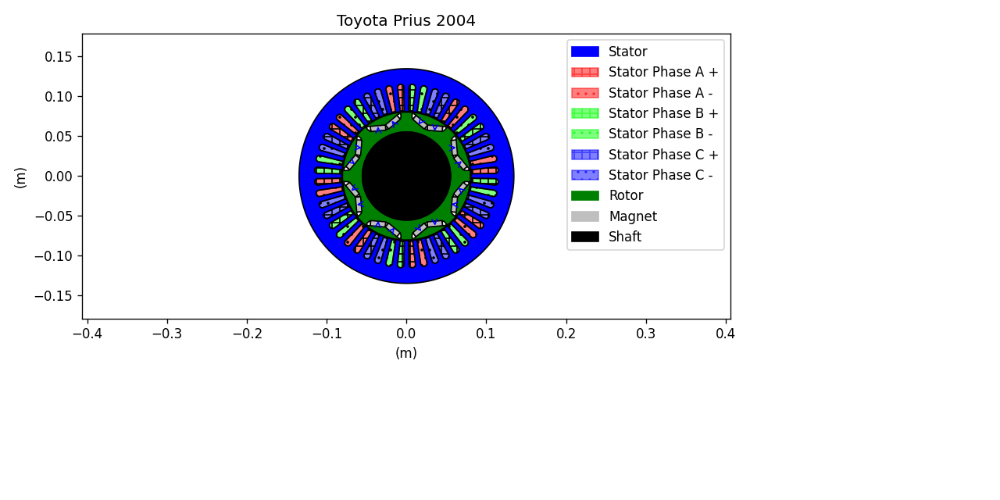

In [291]:
from pyleecan.Classes.MachineIPMSM import MachineIPMSM

%matplotlib notebook
IPMSM_Prius_2004 = MachineIPMSM(
    name="Toyota Prius 2004", 
    stator=stator, 
    rotor=rotor, 
    shaft=shaft, 
    frame=None
)
IPMSM_Prius_2004.save('IPMSM_Toyota_Prius_2004.json')

im=IPMSM_Prius_2004.plot()

Pyleecan은 다음 클래스 덕분에 환기 덕트도 처리합니다.
- [**환기순환**](http://www.pyleecan.org/pyleecan.Classes.VentilationCirc.html)
- [**VentilationPolar**](http://www.pyleecan.org/pyleecan.Classes.VentilationPolar.html)
- [**환기트랩**](http://www.pyleecan.org/pyleecan.Classes.VentilationTrap.html)

# 2) FEMM을 사용한 자기 모델 - Mag/Simu Class

웨비나의 이 부분에서는 pyleecan **자동 커플링과 FEMM**을 사용하여 **자속 및 전자기 토크**를 계산하는 다양한 단계를 보여줍니다. Pyleecan에 정의된 모든 전기 기계는 [FEMM](http://www.femm.info/wiki/HomePage)에서 자동으로 그려 토크, 에어갭 자속 및 기전력을 계산할 수 있습니다.

## 시뮬레이션 정의
### 입력

시뮬레이션은 [**Simu1**](http://www.pyleecan.org/pyleecan.Classes.Simu1.html) 객체로 정의됩니다. 이 개체는 5개의 순차 물리(또는 모듈)가 있는 시뮬레이션에 해당합니다.
- 전기
- 자기
- 힘
- 구조적
- 음향

각 물리/모듈은 이를 해결하기 위해 여러 모델을 가질 수 있습니다. 현재 pyleecan에는 다음이 포함됩니다.
- FEMM이 있는 PMSM 기계용 전기 모델
- 모든 기계에 FEMM이 있는 마그네틱 모델
- Force 모델(Maxwell Tensor)
- GMSH/Elmer를 사용한 자기 및 구조 모델

[**Simu1**](http://www.pyleecan.org/pyleecan.Classes.Simu1.html) 개체는 각 물리 간의 약한 결합을 적용합니다. 각 물리의 입력은 이전 물리의 출력입니다.

자기 물리학은 개체 [**MagFEMM**](https://www.pyleecan.org/pyleecan.Classes.MagFEMM.html)로 정의되고 다른 물리학은 비활성화됩니다(없음으로 설정).

[**InputCurrent**](http://www.pyleecan.org/pyleecan.Classes.InputCurrent.html) 객체로 시뮬레이션의 시작점을 정의하여 전기 모듈 출력을 다음과 같이 적용합니다.
- 각도 및 시간 이산화
- 로터 속도
- 고정자 전류

In [4]:
from os.path import join

from numpy import ones, pi, array, linspace, cos, sqrt

from pyleecan.Classes.Simu1 import Simu1
from pyleecan.Classes.InputCurrent import InputCurrent
from pyleecan.Classes.MagFEMM import MagFEMM
from pyleecan.Functions.load import load
from pyleecan.definitions import DATA_DIR
from pyleecan.Classes.OPdq import OPdq


# Reload machine IPMSM_A
Toyota_Prius = load(join(DATA_DIR, "Machine", "Toyota_Prius.json"))

# Create the Simulation
simu_femm = Simu1(name="Webinar_1_MagFemm", machine=Toyota_Prius)   
p = simu_femm.machine.stator.winding.p
qs = simu_femm.machine.stator.winding.qs


# Defining Simulation Input
simu_femm.input = InputCurrent()
# Rotor speed [rpm]
#simu_femm.input.N0 = 2000
N0 = 3000 
simu_femm.input.OP = OPdq(N0=N0)


# time discretization [s]
time = linspace(start=0, stop=60/N0, num=32*p, endpoint=False) # 32*p timesteps
simu_femm.input.time = time 

# Angular discretization along the airgap circonference for flux density calculation
simu_femm.input.angle = linspace(start = 0, stop = 2*pi, num=2048, endpoint=False) # 2048 steps 




In [3]:
print(simu_femm.input)

parent = <class 'pyleecan.Classes.Simu1.Simu1'> object
time = parent = <class 'pyleecan.Classes.InputCurrent.InputCurrent'> object
	is_transpose = False
	value = 
	[0.         0.00015625 0.0003125  0.00046875 0.000625   0.00078125
 0.0009375  0.00109375 0.00125    0.00140625 0.0015625  0.00171875
 0.001875   0.00203125 0.0021875  0.00234375 0.0025     0.00265625
 0.0028125  0.00296875 0.003125   0.00328125 0.0034375  0.00359375
 0.00375    0.00390625 0.0040625  0.00421875 0.004375   0.00453125
 0.0046875  0.00484375 0.005      0.00515625 0.0053125  0.00546875
 0.005625   0.00578125 0.0059375  0.00609375 0.00625    0.00640625
 0.0065625  0.00671875 0.006875   0.00703125 0.0071875  0.00734375
 0.0075     0.00765625 0.0078125  0.00796875 0.008125   0.00828125
 0.0084375  0.00859375 0.00875    0.00890625 0.0090625  0.00921875
 0.009375   0.00953125 0.0096875  0.00984375 0.01       0.01015625
 0.0103125  0.01046875 0.010625   0.01078125 0.0109375  0.01109375
 0.01125    0.01140625 0.0115625

In [ ]:

#  시간의 함수로서의 고정자 전류, 각 열은 하나의 위상에 해당합니다[A]
I0_rms = 250/sqrt(2) 
felec = p * N0 /60 # [Hz]
rot_dir = simu_femm.machine.stator.comp_mmf_dir()
Phi0 = 140*pi/180  # Maximum Torque Per Amp

Ia = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 0 * rot_dir * 2 * pi / qs + Phi0)
)
Ib = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 1 * rot_dir * 2 * pi / qs + Phi0)
)
Ic = (
    I0_rms
    * sqrt(2)
    * cos(2 * pi * felec * time + 2 * rot_dir * 2 * pi / qs + Phi0)
)
simu_femm.input.Is = array([Ia, Ib, Ic]).transpose()

이 예에서 고정자 전류는 각 위상에 대한 시간 함수로 적용됩니다. 사인파 전류는 [이 튜토리얼](https://www.pyleecan.org/tuto_Operating_point.html)에 설명된 대로 Id/Iq로 정의할 수도 있습니다.

### MagFEMM 구성
Magnetic 모듈의 구성을 위해 FEMM을 호출하여 에어갭 자속 밀도를 계산하는 객체 [**MagFEMM**](https://www.pyleecan.org/pyleecan.Classes.MagFEMM.html)를 사용합니다. 모델 매개변수는 [**MagFEMM**](https://www.pyleecan.org/pyleecan.Classes.MagFEMM.html) 객체의 속성을 통해 설정됩니다. 이 튜토리얼에서 우리는 주요 것들을 제시할 것입니다. 전체 목록은 [**Magnetics**](http://www.pyleecan.org/pyleecan.Classes.Magnetics.html) 및 [**MagFEMM* *](http://www.pyleecan.org/pyleecan.Classes.MagFEMM.html) 클래스 문서.

*type_BH_stator* 및 *type_BH_rotor*를 사용하면 FEMM에서 적층의 B(H) 곡선을 모델링하는 방법을 선택할 수 있습니다. 재료 매개변수와 특히 B(H) 곡선은 [기계에서](https://www.pyleecan.org/tuto_Machine.html) 직접 설정됩니다.

In [2]:
from pyleecan.Classes.MagFEMM import MagFEMM

simu_femm.mag = MagFEMM(
    type_BH_stator=0, # 0 to use the material B(H) curve, 
                      # 1 to use linear B(H) curve according to mur_lin,
                      # 2 to enforce infinite permeability (mur_lin =100000)
    type_BH_rotor=0,  # 0 to use the material B(H) curve, 
                      # 1 to use linear B(H) curve according to mur_lin,
                      # 2 to enforce infinite permeability (mur_lin =100000)
    file_name = "th_dontgohome.fem", # Name of the file to save the FEMM model
)

# Only the magnetic module is defined
simu_femm.elec = None
simu_femm.force = None
simu_femm.struct = None 

FEMM과 Pyleecan 커플링을 사용하면 대칭 및 슬라이딩 밴드로 기계를 정의하여 계산 시간을 최적화할 수 있습니다. 기계의 각 주기성이 계산되고 (특정 경우) 기계의 1/8만 그려집니다(4 대칭 + 반주기):

In [6]:
simu_femm.mag.is_periodicity_a=True

시간 주기성에 대해서도 동일한 작업이 수행됩니다. 한 전기 주기의 절반만 계산됩니다(즉, 기계적 주기의 1/8).

In [7]:
simu_femm.mag.is_periodicity_t=True

Pyleecan은 다음을 간단히 설정하여 FEMM에 대한 호출을 병렬화할 수 있습니다.

In [8]:
simu_femm.mag.nb_worker = 4  # Number of FEMM instances to run at the same time (1 by default)

시뮬레이션이 끝나면 메시와 솔루션을 다음을 사용하여 출력 개체에 저장할 수 있습니다.

In [9]:
simu_femm.mag.is_get_meshsolution = True # To get FEA mesh for latter post-procesing
simu_femm.mag.is_save_meshsolution_as_file = False # To save FEA results in a dat file

## 시뮬레이션 실행

In [10]:
out_femm = simu_femm.run()

[01:35:54] Starting running simulation Webinar_1_MagFemm (machine=Toyota_Prius)
[01:35:54] Starting Magnetic module
[01:35:55] Solving time step 9 / 16 in FEMM
[01:35:55] Solving time step 13 / 16 in FEMM
[01:35:55] Solving time step 5 / 16 in FEMM
[01:35:56] Solving time step 1 / 16 in FEMM
[01:35:57] Solving time step 14 / 16 in FEMM
[01:35:57] Solving time step 10 / 16 in FEMM
[01:35:57] Solving time step 6 / 16 in FEMM
[01:35:57] Solving time step 2 / 16 in FEMM
[01:35:58] Solving time step 15 / 16 in FEMM
[01:35:59] Solving time step 11 / 16 in FEMM
[01:35:59] Solving time step 7 / 16 in FEMM
[01:35:59] Solving time step 3 / 16 in FEMM
[01:35:59] Solving time step 16 / 16 in FEMM
[01:36:00] Solving time step 12 / 16 in FEMM
[01:36:00] Solving time step 4 / 16 in FEMM
[01:36:00] Solving time step 8 / 16 in FEMM
[01:36:02] End of simulation Webinar_1_MagFemm


시뮬레이션을 실행할 때 FEMM 창이 백그라운드에서 실행됩니다. 그것을 열면 pyleecan이 기계를 그리고 표면을 정의하는 것을 볼 수 있습니다.
![](https://www.pyleecan.org/_static/IPMSM_FEMM.png)
시뮬레이션은 현재 및 슬라이딩 밴드 경계 조건을 업데이트하여 16개의 다른 시간 단계를 계산합니다.

시뮬레이션이 완료되면 출력 개체가 반환됩니다. 결과는 출력의 자기 부분(예: _out_femm.mag_ )에 저장되며 다른 플롯을 호출할 수 있습니다. 이 _out_femm.mag_에는 다음이 포함됩니다.
- *시간*: 대칭이 없는 자기 시간 벡터
- *각도*: 대칭이 없는 자기 위치 벡터
- *B*: 에어갭 자속 밀도(방사형 및 접선 성분 포함)
- *Tem*: 전자기 토크
- *Tem_av*: 평균 전자기 토크
- *Tem_rip_pp* : 피크 대 피크 토크 리플
- *Tem_rip_norm*: 평균 토크에 따라 정규화된 Peak to Peak Torque 리플
- *Phi_wind_stator*: 고정자 권선 자속
- *emf*: 기전력

이러한 속성 중 일부는 [SciDataTool](https://github.com/Eomys/SciDataTool) 프로젝트의 "데이터 개체"입니다. 이 개체는 단위 변환, 보간, fft, 주기성 등을 처리할 수 있도록 합니다. 두 번째 웨비나에서 자세히 소개합니다.

## 플롯 결과
**출력** 개체는 결과를 쉽게 시각화하기 위해 다른 플롯을 포함합니다. 전용 튜토리얼은 [여기](https://www.pyleecan.org/tuto_Plots.html)에서 사용할 수 있습니다.

예를 들어, 특정 시간 단계에서 에어갭의 방사형 및 접선 방향 자속은 다음과 같이 표시할 수 있습니다.

c:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan_v1\lib\site-packages\SciDataTool\Functions\Plot\plot_2D.py:443: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


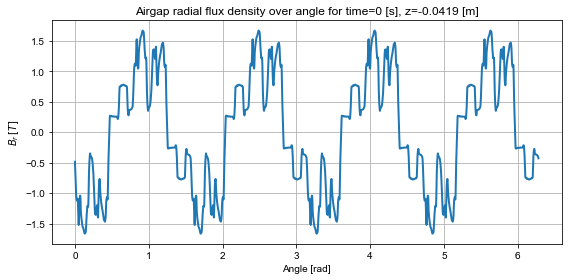

In [11]:
# Radial magnetic flux over space
out_femm.mag.B.plot_2D_Data("angle","time[0]",component_list=["radial"])

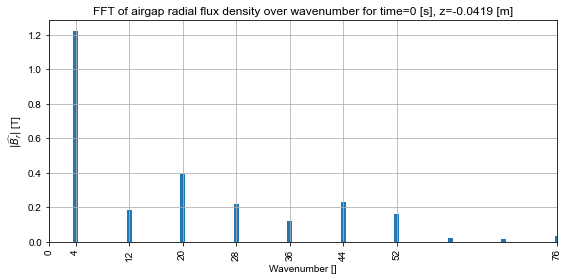

In [12]:
# Radial magnetic flux FFT over space
out_femm.mag.B.plot_2D_Data("wavenumber=[0,76]","time[0]", component_list=["radial"])

c:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan_v1\lib\site-packages\SciDataTool\Functions\Plot\plot_2D.py:443: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


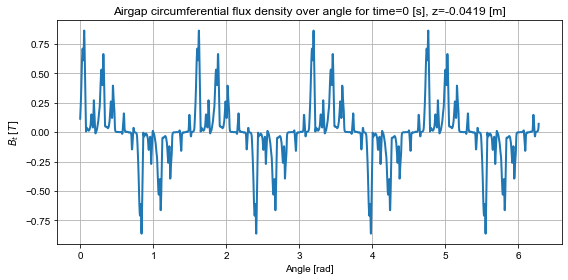

In [13]:
# Tangential magnetic flux over space
out_femm.mag.B.plot_2D_Data("angle","time[0]", component_list=["tangential"])

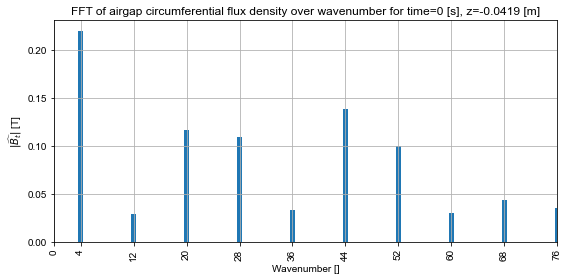

In [14]:
# Tangential magnetic flux FFT over space
out_femm.mag.B.plot_2D_Data("wavenumber=[0,76]","time[0]", component_list=["tangential"])

c:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan_v1\lib\site-packages\SciDataTool\Functions\Plot\plot_2D.py:443: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


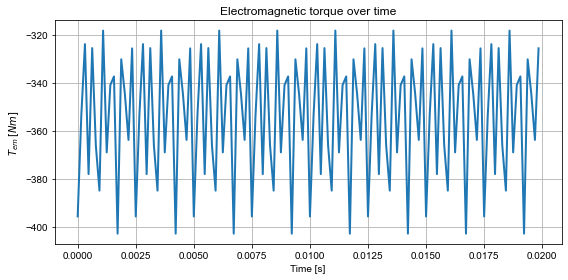

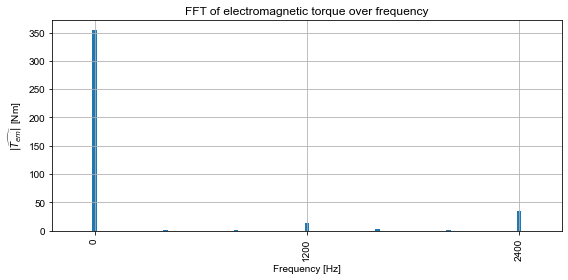

In [15]:
# Torque, one can see that the first torque ripple harmonic is at N0/60*p*6=800 Hz
out_femm.mag.Tem.plot_2D_Data("time")
out_femm.mag.Tem.plot_2D_Data("freqs=[0,3000]")

메쉬가 출력 객체에 저장된 경우(simu_femm.mag.is_get_meshsolution = True) 다음과 같이 플롯할 수 있습니다.

In [16]:
out_femm.mag.meshsolution.plot_contour(label="B", group_names="stator core")

c:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan_v1\lib\site-packages\SciDataTool\Functions\Plot\plot_2D.py:443: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


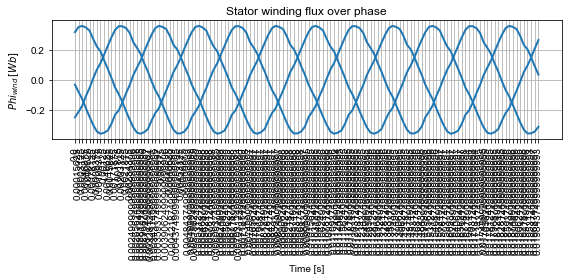

In [17]:
out_femm.mag.Phi_wind_stator.plot_2D_Data("time","phase")

In [18]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode 
init_notebook_mode() 

result = out_femm.mag.B.components["radial"].get_along("angle{°}", "time")
x = result["angle"]
y = result["time"]
z = result["B_r"]
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout( )
fig.update_layout(title='Radial flux density in the airgap over time and angle',
                  autosize=True,
                  scene = dict(
                      xaxis_title='Angle [°]',
                      yaxis_title='Time [s]',
                      zaxis_title='Flux [T]'
                  ),
                  width=700,
                  margin=dict(r=20, b=100, l=10, t=100),
                 )

fig.show(config = {"displaylogo":False})

# 3) 동작점 설정 방법 - InputCurrent Class
웹 세미나의 이 부분에서는 개체 OPdq, InputCurrent 및 VarLoadCurrent를 사용하여 Id/Iq 또는 I0/Phi0을 설정하여 여러 작동 지점에서 자기 시뮬레이션을 실행하는 방법을 설명합니다.

웨비나의 이 부분을 검증하는 데 사용된 참조 자료는 \[3\]입니다. Z. Yang, M. Krishnamurthy 및 I. P. Brown, "전체 토크 속도 범위에서 IPM의 전자기 및 진동 특성"

In [19]:
from pyleecan.Classes.Simu1 import Simu1
from pyleecan.Classes.MagFEMM import MagFEMM

# 시뮬레이션 초기화
simu_op = Simu1(name="Webinar_1_Id_Iq", machine=Toyota_Prius)

# 자기 시뮬레이션의 정의(대칭 및 슬라이딩 밴드가 있는 FEMM)
simu_op.mag = MagFEMM(
    type_BH_stator=0,
    type_BH_rotor=0,
    is_periodicity_a=True,
    is_periodicity_t=True,
    Kgeo_fineness=1,
    nb_worker=4,
)
# 자기 모듈만 정의됨
simu_op.elec = None
simu_op.force = None
simu_op.struct = None

## Id/Iq로 동작점 정의하기
InputCurrent 개체를 사용하면 전기 모듈의 출력과 자기 모듈의 입력에 해당하는 "OutElec" 개체를 만들 수 있습니다. 이 예에서 InputCurrent는 Id_ref 및 Iq_ref로 정의된 사인파 전류로 시작점을 정의하는 데 사용됩니다.

In [23]:
from pyleecan.Classes.InputCurrent import InputCurrent
from numpy import exp

#정현파 전류의 정의
simu_op.input = InputCurrent()

# I0, Phi0 설정
I0_rms = 250/sqrt(2) # Maximum current [Arms]
Phi0 = 140*pi/180  # Maximum Torque Per Amp

# 해당 Id/Iq 계산
Id_ref = (I0_rms*exp(1j*Phi0)).real
Iq_ref = (I0_rms*exp(1j*Phi0)).imag

# 값 설정
#simu_op.input.Id_ref = Id_ref # [A] (RMS)
#simu_op.input.Iq_ref = Iq_ref # [A] (RMS)
#-> 
simu_op.input.OP = OPdq(Id_ref=Id_ref, Iq_ref=Iq_ref)


(Id_ref,Iq_ref)

(-135.4188051049254, 113.62986941801093)

## TB correct

In [27]:
import numpy as np 
# Generate ELUT
name = "EEC_ELUT_PMSM"
simu = Simu1(name=name, machine=Toyota_Prius)

# Definition of the input
simu.input = InputCurrent(
Nt_tot=8 * 12,
Na_tot=8 * 200,
OP=OPdq(N0=1000, Id_ref=0, Iq_ref=0),
)

# Build OP_matrix with a meshgrid of Id/Iq
Id_min, Id_max = -200, 200
Iq_min, Iq_max = -200, 200
Id, Iq = np.meshgrid(
np.linspace(Id_min, Id_max, n_Id), np.linspace(Iq_min, Iq_max, n_Iq)
)

OP_matrix = np.zeros((n_Id * n_Iq, 3))
OP_matrix[:, 0] = simu.input.OP.N0
OP_matrix[:, 1] = Id.ravel() #ravel() 다차원 배열 1차원 변환 함수
OP_matrix[:, 2] = Iq.ravel()

# Set varspeed simulation
simu.var_simu = VarLoadCurrent(
type_OP_matrix=1,
OP_matrix=OP_matrix,
is_keep_all_output=True,
stop_if_error=True,
)
# simu for FEMM comparison
simu.mag = MagFEMM(is_periodicity_a=True, is_periodicity_t=True, nb_worker=16)
simu.force = ForceMT(is_periodicity_a=True, is_periodicity_t=True,is_agsf_transfer=True,max_wavenumber_transfer=96)

simu.var_simu.postproc_list = [PostLUT(is_save_LUT=True)]

out = simu.run()

ELUT = out.simu.var_simu.postproc_list[0].LUT


NameError: name 'n_Id' is not defined

전류 및 자기 계산을 위한 이산화는 다음 매개변수를 사용하여 설정할 수도 있습니다.

In [28]:
simu_op.input.Nt_tot = 128 # Number of time step
simu_op.input.Na_tot = 2048 # 공간 이산화
simu_op.input.OP.N0 = 2000 # Rotor speed [rpm]

Nt_tot가 정의되면 시간 벡터는 자동으로 다음과 같이 설정됩니다.

     linspace(0, 60 / N0 * Nrev, Nt_tot)

Nrev로 로터의 회전 수(기본값은 1)

Na_tot가 정의되면 각도 벡터는 자동으로 다음과 같이 설정됩니다.

     linspace(0, 2*pi, Na_tot)

이제 입력이 완전히 정의되었으며 시뮬레이션을 실행할 수 있습니다.

In [29]:
out_op = simu_op.run()

[01:38:54] Starting running simulation Webinar_1_Id_Iq (machine=Toyota_Prius)
[01:38:54] Starting Magnetic module
[01:38:55] Solving time step 1 / 16 in FEMM
[01:38:56] Solving time step 5 / 16 in FEMM
[01:38:56] Solving time step 9 / 16 in FEMM
[01:38:56] Solving time step 13 / 16 in FEMM
[01:38:57] Solving time step 2 / 16 in FEMM
[01:38:57] Solving time step 6 / 16 in FEMM
[01:38:57] Solving time step 10 / 16 in FEMM
[01:38:58] Solving time step 14 / 16 in FEMM
[01:38:58] Solving time step 3 / 16 in FEMM
[01:38:58] Solving time step 7 / 16 in FEMM
[01:38:58] Solving time step 11 / 16 in FEMM
[01:38:59] Solving time step 15 / 16 in FEMM
[01:38:59] Solving time step 4 / 16 in FEMM
[01:38:59] Solving time step 8 / 16 in FEMM
[01:38:59] Solving time step 12 / 16 in FEMM
[01:39:00] Solving time step 16 / 16 in FEMM
[01:39:00] End of simulation Webinar_1_Id_Iq


<IPython.core.display.Javascript object>


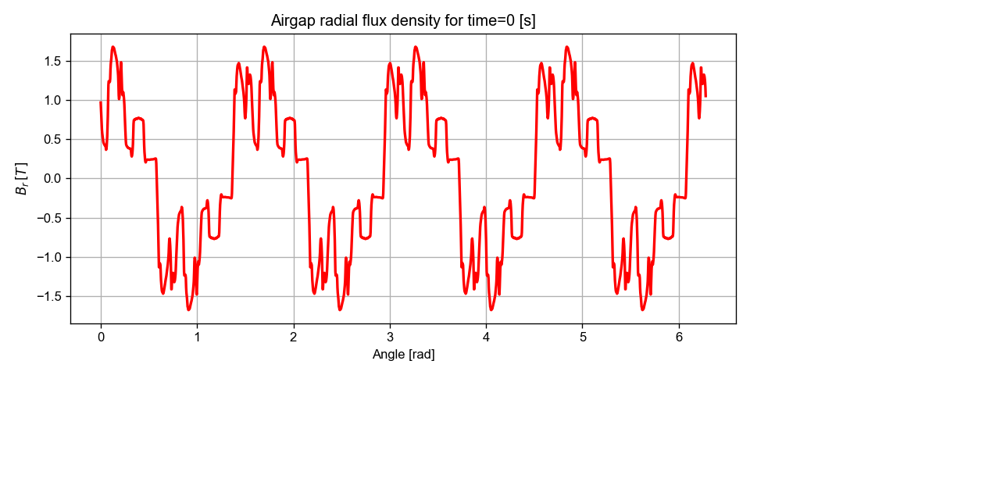

<IPython.core.display.Javascript object>


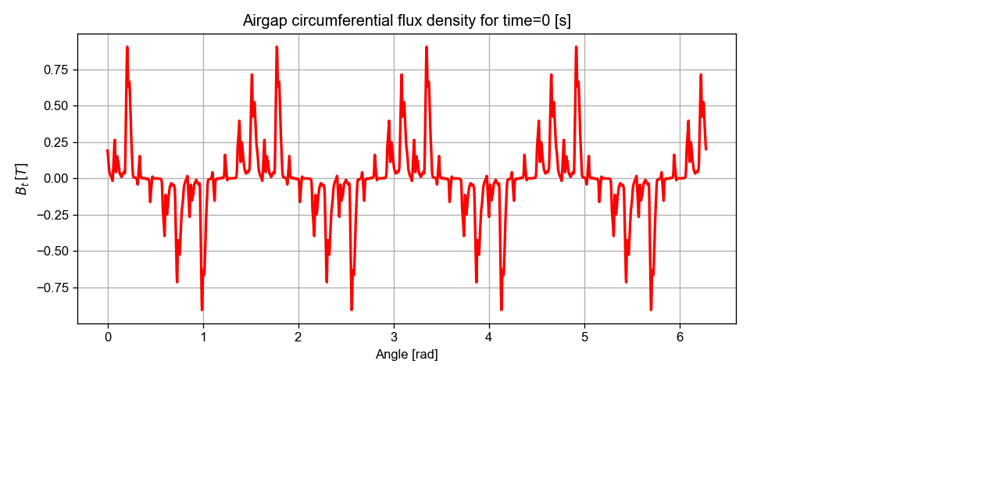

<IPython.core.display.Javascript object>


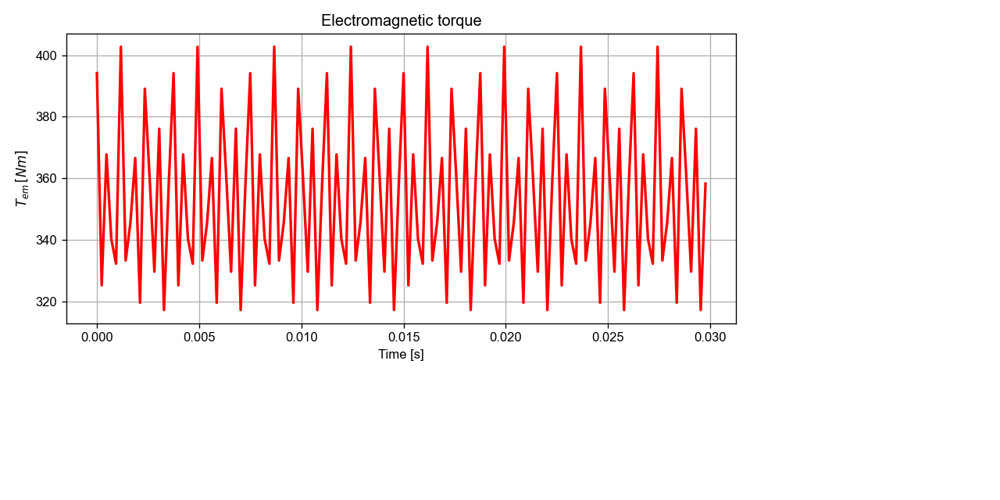

<IPython.core.display.Javascript object>


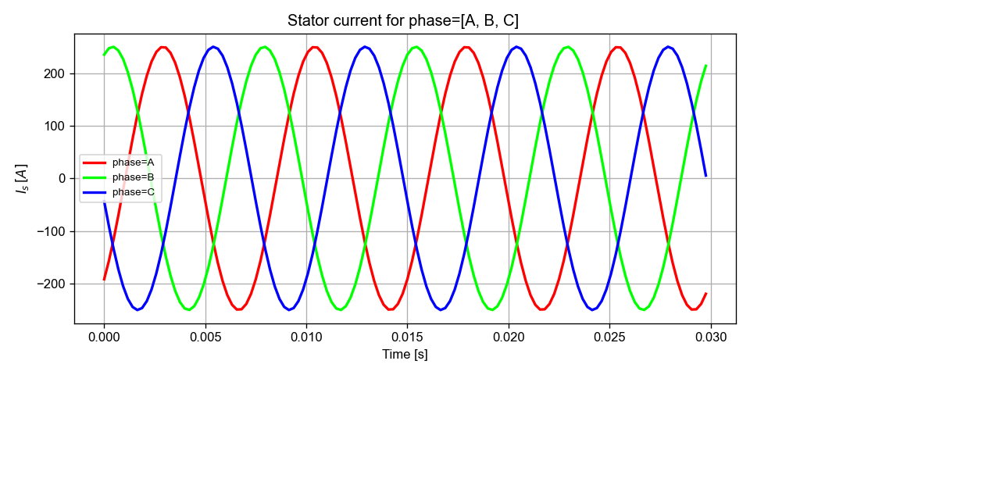

In [313]:
from pyleecan.Functions.Plot import dict_2D

# Plot the flux
out_op.mag.B.plot_2D_Data("angle", **dict_2D)
# Plot the torque
out_op.mag.Tem.plot_2D_Data("time", **dict_2D)
# Plot the current
out_op.elec.get_Is().plot_2D_Data("time", "phase[]", **dict_2D)

작동 지점은 다음을 사용하여 I0 / Phi0으로 정의할 수도 있습니다(객체 속성은 여전히 Id_ref 및 Iq_ref임).

In [314]:
from numpy import pi

#simu_op.input.set_Id_Iq(I0=I0_rms, Phi0=Phi0)

simu_op.input.OP.set_I0_Phi0(I0=I0_rms, Phi0=Phi0)
simu_op.input.OP.get_Id_Iq()


{'Id': -135.4188051049254, 'Iq': 113.62986941801093}

## 여러 동작 지점에서 반복


각 pyleecan 시뮬레이션은 Quasi-static이며 단일 작동 지점(고정 속도)에서 실행되는 것으로 가정합니다. 여러 작동 지점에서 시뮬레이션을 실행하려면 두 단계가 필요합니다. 먼저 단일 작동 지점(위에 정의된 것과 같은)에서 올바르게 실행되는 시뮬레이션을 정의한 다음 VarLoadCurrent 개체를 정의합니다.

VarLoadCurrent 개체는 각 행이 작동점에 해당하는 행렬로 정의되며 열은 다음과 같습니다.
- (N0, I0, Phi0) type_OP_matrix==0인 경우
- (N0, Id, Iq) type_OP_matrix==1인 경우

다음 VarLoadCurrent 개체는 Phi0 값을 변경하여 이전 시뮬레이션을 N_simu 번 실행합니다.

is_torque=True를 설정하여 네 번째 열을 추가할 수 있습니다. 작동점에 대한 기준 토크를 정의할 수 있습니다. 기준은 output.elec.Tem_av_ref에 저장되고 실제 계산된 토크는 output.mag.Tem_av에 저장됩니다.

기준 토크 및 현재 각도 벡터는 다음과 같습니다.

In [315]:
from numpy import linspace, array, pi
Tem_av_ref = array([79, 125, 160, 192, 237, 281, 319, 343, 353, 332, 266, 164, 22]) # Yang et al, 2013
Phi0_ref = linspace(60 * pi / 180, 180 * pi / 180, Tem_av_ref.size)
N_simu = Tem_av_ref.size

In [316]:
from pyleecan.Classes.VarLoadCurrent import VarLoadCurrent
from numpy import zeros, ones, linspace, array, sqrt, arange

varload = VarLoadCurrent(is_torque=True, is_reuse_femm_file=True)
varload.type_OP_matrix = 0 # Matrix N0, I0, Phi0

# Choose which operating points to run
step = 2 # step=1 to do all OP
         # step=2 to do 1 OP out of 2 (fastest)    
I_simu = arange(0,Tem_av_ref.size, step) 
N_simu = I_simu.size

# 동작점 행렬 생성
OP_matrix = zeros((N_simu,4))

# 모든 시뮬레이션에 대해 N0 = 2000 [rpm]으로 설정 - 행렬의 0+1열에 속도입력
OP_matrix[:,0] = 2000 * ones((N_simu))

# 모든 시뮬레이션에 대해 I0 = 250 / sqrt(2) [A](RMS)를 설정합니다. - 행렬의 1+1열에 I0 입력
OP_matrix[:,1] = I0_rms * ones((N_simu)) 

# Phi0을 60°에서 180°로 설정합니다.  - 행렬의 2+1열에 Phi0 입력
OP_matrix[:,2] = Phi0_ref[I_simu]

# Yang et al, 2013의 기준 토크 설정 - 행렬의 3+1열에 기준 토크 입력
OP_matrix[:,3] = Tem_av_ref[I_simu]

varload.OP_matrix = OP_matrix
print(OP_matrix)


[[2.00000000e+03 1.76776695e+02 1.04719755e+00 7.90000000e+01]
 [2.00000000e+03 1.76776695e+02 1.39626340e+00 1.60000000e+02]
 [2.00000000e+03 1.76776695e+02 1.74532925e+00 2.37000000e+02]
 [2.00000000e+03 1.76776695e+02 2.09439510e+00 3.19000000e+02]
 [2.00000000e+03 1.76776695e+02 2.44346095e+00 3.53000000e+02]
 [2.00000000e+03 1.76776695e+02 2.79252680e+00 2.66000000e+02]
 [2.00000000e+03 1.76776695e+02 3.14159265e+00 2.20000000e+01]]


In [317]:
# 모든 시뮬레이션은 동일한 기계를 사용합니다.
# 모든 OP에 대해 기계를 그릴 필요가 없습니다.
varload.is_reuse_femm_file=True  

원래 시뮬레이션은 매트릭스에 따라 업데이트된 InputCurrent 값으로 N_simu 번 복제됩니다.

In [318]:
simu_vop = simu_op.copy()
simu_vop.var_simu = varload

# 속도 향상 계산(참조 simu를 첫 번째 OP로 설정)
simu_vop.input.set_OP_from_array(varload.OP_matrix, varload.type_OP_matrix)

Xout_vop = simu_vop.run()

[13:32:48] Starting running simulation Webinar_1_Id_Iq (machine=Toyota_Prius)
[13:32:48] Reference Operating point is not in OP_matrix, one extra simulation will be computed
[13:32:48] Computing reference simulation for Variable Load
[13:32:48] Starting Magnetic module
[13:32:49] Solving time step 5 / 16 in FEMM
[13:32:49] Solving time step 13 / 16 in FEMM
[13:32:49] Solving time step 1 / 16 in FEMM
[13:32:50] Solving time step 9 / 16 in FEMM
[13:32:50] Solving time step 6 / 16 in FEMM
[13:32:50] Solving time step 14 / 16 in FEMM
[13:32:50] Solving time step 2 / 16 in FEMM
[13:32:51] Solving time step 10 / 16 in FEMM
[13:32:51] Solving time step 7 / 16 in FEMM
[13:32:51] Solving time step 15 / 16 in FEMM
[13:32:51] Solving time step 3 / 16 in FEMM
[13:32:52] Solving time step 11 / 16 in FEMM
[13:32:52] Solving time step 8 / 16 in FEMM
[13:32:52] Solving time step 16 / 16 in FEMM
[13:32:52] Solving time step 4 / 16 in FEMM
[13:32:53] Solving time step 12 / 16 in FEMM
[13:32:53] Variable

[13:33:22] Solving time step 5 / 16 in FEMM
[13:33:22] Solving time step 9 / 16 in FEMM
[13:33:23] Solving time step 13 / 16 in FEMM
[13:33:24] Solving time step 6 / 16 in FEMM
[13:33:24] Solving time step 2 / 16 in FEMM
[13:33:24] Solving time step 14 / 16 in FEMM
[13:33:24] Solving time step 10 / 16 in FEMM
[13:33:24] Solving time step 3 / 16 in FEMM
[13:33:24] Solving time step 7 / 16 in FEMM
[13:33:25] Solving time step 15 / 16 in FEMM
[13:33:25] Solving time step 11 / 16 in FEMM
[13:33:25] Solving time step 4 / 16 in FEMM
[13:33:25] Solving time step 8 / 16 in FEMM
[13:33:26] Solving time step 16 / 16 in FEMM
[13:33:26] Solving time step 12 / 16 in FEMM
[13:33:26] Variable Load Results: N0=2000 [rpm], Id=-176.8 [Arms], Iq=0 [Arms], I0=176.8 [A], Phi0=3.142 [], Tem_av=-5.314 [N.m], Tem_rip_pp=41.06 [N.m], Tem_rip_norm=-7.727 [-], Pem_av=-1113 [W]
[==================================================] 100%
[13:33:26] End of simulation Webinar_1_Id_Iq


VarLoadCurrent는 "Output" 개체가 아닌 "XOutput"을 반환하는 "다중 시뮬레이션"을 정의합니다. XOutput은 출력 개체(모든 일반 속성은 참조 시뮬레이션 결과로 설정됨) 및 다중 시뮬레이션에 해당하는 기타 속성입니다.

Pyleecan은 각 시뮬레이션에서 일부 값을 자동으로 추출합니다. 이 값은 모두 xoutput_dict에 수집됩니다.

In [319]:
print("Values available in XOutput:")
print(Xout_vop.xoutput_dict.keys())

print("\nI0 for each simulation:")
print(Xout_vop["I0"].result)
print("\nPhi0 for each simulation:")
print(Xout_vop["Phi0"].result)

Values available in XOutput:
dict_keys(['N0', 'Id', 'Iq', 'I0', 'Phi0', 'Tem_av_ref', 'Tem_av', 'Tem_rip_pp', 'Tem_rip_norm', 'Pem_av'])

I0 for each simulation:
[176.77669529663686, 176.77669529663683, 176.77669529663683, 176.77669529663686, 176.77669529663686, 176.77669529663683, 176.77669529663686]

Phi0 for each simulation:
[1.0471975511965976, 1.3962634015954636, 1.7453292519943295, 2.0943951023931957, 2.443460952792061, 2.7925268031909276, 3.141592653589793]


XOutput의 모든 매개변수는 다른 매개변수의 함수로 플롯될 수 있습니다.

<IPython.core.display.Javascript object>


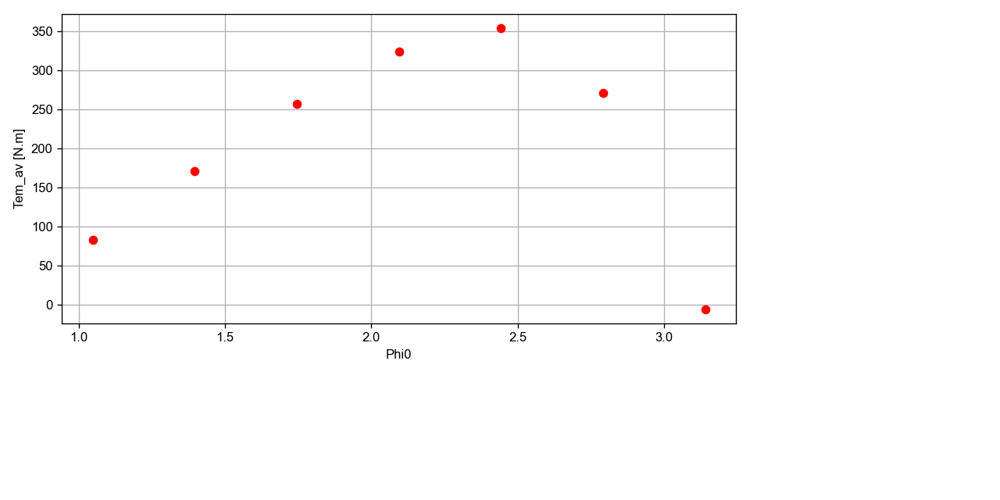

<IPython.core.display.Javascript object>


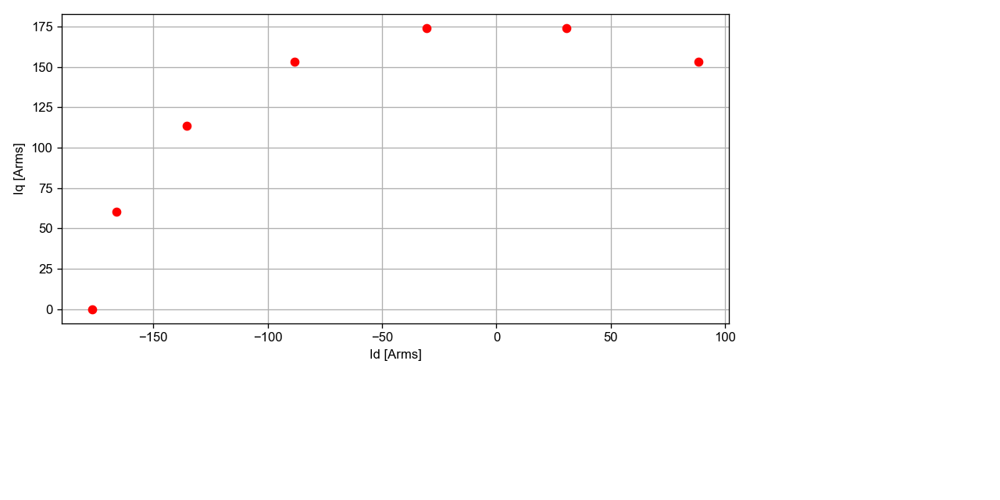

<IPython.core.display.Javascript object>


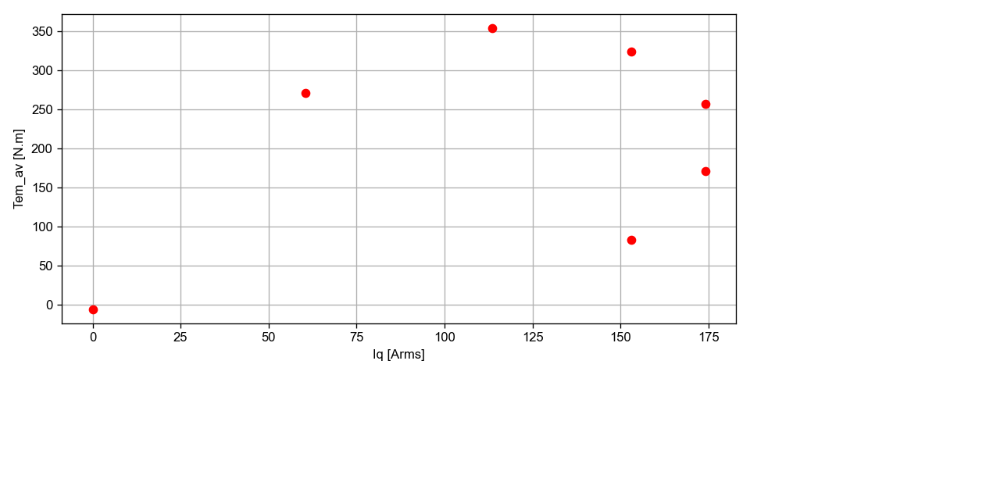

<IPython.core.display.Javascript object>


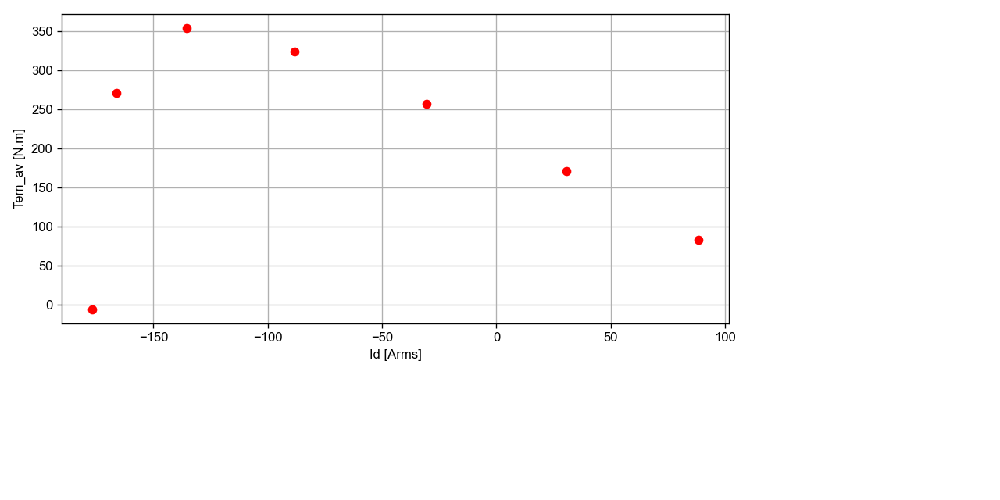

In [320]:
fig = Xout_vop.plot_multi("Phi0", "Tem_av")
fig = Xout_vop.plot_multi("Id", "Iq")
fig = Xout_vop.plot_multi("Iq","Tem_av")
fig = Xout_vop.plot_multi("Id","Tem_av")



두 번째 웨비나에서 소개될 "DataKeeper" 객체를 사용하여 XOutput에 저장할 pyleecan을 선택할 수 있습니다.

마지막으로 계산된 평균 토크는 Yang 등의 간행물에 있는 것과 비교할 수 있습니다(데이터는 [Engauge Digitizer](http://markummitchell.github.io/engauge-digitizer/)를 사용하여 그래프에서 추출되었습니다. 일반 플롯 함수 `plot_A_2D`가 여기에 사용되었습니다.

<IPython.core.display.Javascript object>


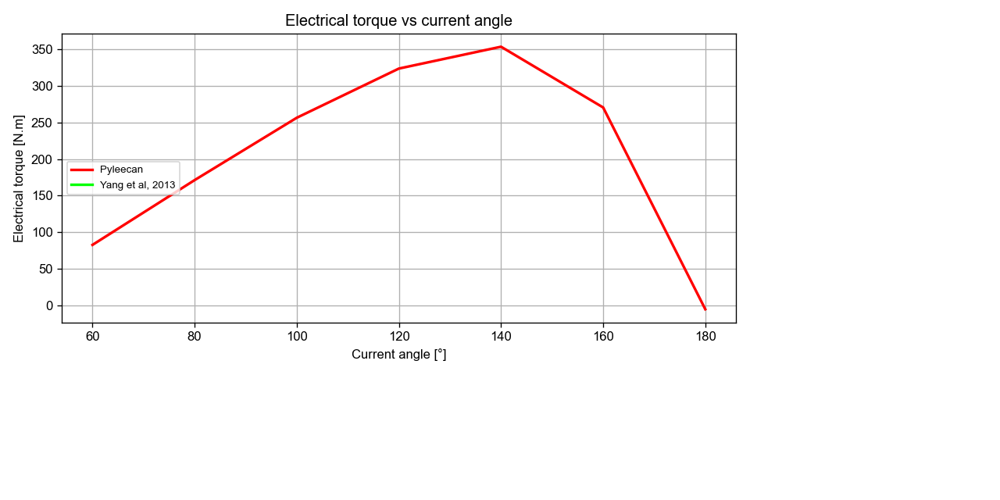

In [321]:
from SciDataTool.Functions.Plot.plot_2D import plot_2D
from pyleecan.definitions import config_dict
from numpy import array

curve_colors = config_dict["PLOT"]["COLOR_DICT"]["CURVE_COLORS"]

plot_2D(
    array([x*180/pi for x in Xout_vop.xoutput_dict["Phi0"].result]),
    [Xout_vop.xoutput_dict["Tem_av"].result, Xout_vop.xoutput_dict["Tem_av_ref"].result],
    color_list=curve_colors,
    legend_list=["Pyleecan", "Yang et al, 2013"],
    xlabel="Current angle [°]",
    ylabel="Electrical torque [N.m]",
    title="Electrical torque vs current angle"
)

# 4) 전기 모듈을 사용하여 전류, 전압 및 토크를 계산하는 방법

웨비나의 이 부분에서는 전기 모듈을 사용하여 간단한 **전기적 등가 회로**를 사용하여 전류, 전압 및 토크를 계산하는 방법을 설명합니다. 아이디어는 다른 방법을 구현하는 방법에 대한 통찰력을 제공하는 것입니다.

이 부분을 검증하는 데 사용된 참조는 \[3\]입니다. Z. Yang, M. Krishnamurthy 및 I. P. Brown, "전체 토크 속도 범위에 걸친 IPM의 전자기 및 진동 특성,"

## 전기 등가 회로(EEC)
전기 모듈은 "Advanced Electrical Drives, analysis, modelling, control", Rik de doncker, Duco W.J. Pulle, Andre Veltman, Springer 에디션의 **전기적 등가 회로**에 해당하는 객체 EEC_PMSM으로 정의됩니다. Ud/Uq 또는 Id/Iq의 계산을 위한 것입니다(이하 도식 참조).

EEC의 매개변수는 먼저 `FluxLinkFEMM` 및 `IndMagFEMM`  개체에 따라 계산됩니다. 그들
FEMM 시뮬레이션(대칭 및 시간 단계 수 포함)을 사용하여 쇄교자속 및 자기 인덕턴스를 계산할 수 있습니다. 자속 쇄교 계산을 위해 전류는 0A로 설정됩니다.

EEC의 매개변수가 알려지면 전압을 계산할 수 있습니다. 전기 토크는 다음 공식에 따라 계산됩니다. 
$T_{em}=\frac{P-RI^2}{\Omega}$, 여기서 $P$는 자기력 $P=q_s\Re(VI^* )$

                 <---                               --->
     -----R-----wsLqIq----              -----R-----wsLdId----
    |                     |            |                     |
    |                     |            |                    BEMF
    |                     |            |                     |
     ---------Id----------              ---------Iq----------
             
             --->                               ---> 
              Ud                                 Uq

In [322]:
from pyleecan.Classes.Simu1 import Simu1
from pyleecan.Classes.Electrical import Electrical
from pyleecan.Classes.EEC_PMSM import EEC_PMSM
from pyleecan.Classes.FluxLinkFEMM import FluxLinkFEMM
from pyleecan.Classes.IndMagFEMM import IndMagFEMM

# 시뮬레이션 초기화
simu_elec = Simu1(name="Webinar_1_elec", machine=Toyota_Prius)

# 자기 시뮬레이션의 정의(대칭 및 슬라이딩 밴드가 있는 FEMM)
simu_elec.elec = Electrical(
    eec=EEC_PMSM(
        indmag=IndMagFEMM(is_periodicity_a=True, Nt_tot=10),
        fluxlink=FluxLinkFEMM(is_periodicity_a=True, Nt_tot=10),
    )
)
# Run only Electrical module
simu_elec.mag = None
simu_elec.force = None
simu_elec.struct = None

## InputElec 또는 InputCurrent로 시작점 정의

시뮬레이션의 시작점은 `InputElec` 또는 `InputCurrent`로 정의됩니다. 이 개체는 `OutElec` 개체를 만들고 Id/Iq 및/또는 `InputElec`을 사용하여 Ud/Uq에 대해 제공된 값으로 초기화합니다.

Id/Iq는 자기 인덕턴스를 정확하게 계산하는 데 필요하므로 Ud/Uq만 제공되는 경우 전류 Id=1A 및 Iq=1A가 Ld 및 Lq 계산에 사용됩니다. 보다 만족스러운 방법은 Id/Iq에 대한 Ld 및 Lq의 맵을 계산하는 것입니다.

In [323]:
from pyleecan.Classes.InputCurrent import InputCurrent
from numpy import sqrt, exp, pi

#정현파 전류의 정의
simu_elec.input = InputCurrent()

# I0, Phi0 설정
I0_rms = 250/sqrt(2) # Maximum current [Arms]
Phi0 = 140*pi/180  # Maximum Torque Per Amp

# 해당 Id/Iq 계산
Id_ref = (I0_rms*exp(1j*Phi0)).real
Iq_ref = (I0_rms*exp(1j*Phi0)).imag

# 값 설정
N0=2000
simu_elec.input.OP = OPdq(Id_ref=Id_ref, Iq_ref=Iq_ref,N0=N0)

simu_elec.input.Nt_tot = 50 # 자속 결합 및 인덕턴스를 계산하기 위한 시간 단계 수
simu_elec.input.Na_tot = 2048 # 공간 이산화

(Id_ref,Iq_ref)

(-135.4188051049254, 113.62986941801093)

## 시뮬레이션 및 후처리 실행

In [324]:
out_elec = simu_elec.run()

[13:33:43] Starting running simulation Webinar_1_elec (machine=Toyota_Prius)
[13:33:43] Starting Electric module
[13:33:43] Compute flux linkage with FEMM
[13:33:43] Starting running simulation Webinar_1_elec_FluxLinkFEMM (machine=Toyota_Prius)
[13:33:43] Starting Magnetic module
[13:33:43] In Magnetic model, Nt_tot=10 is not divisible by the machine time periodicity (4). Time periodicity removed
[13:33:44] Solving time step 1 / 10 in FEMM
[13:33:45] Solving time step 2 / 10 in FEMM
[13:33:46] Solving time step 3 / 10 in FEMM
[13:33:46] Solving time step 4 / 10 in FEMM
[13:33:47] Solving time step 5 / 10 in FEMM
[13:33:48] Solving time step 6 / 10 in FEMM
[13:33:49] Solving time step 7 / 10 in FEMM
[13:33:49] Solving time step 8 / 10 in FEMM
[13:33:50] Solving time step 9 / 10 in FEMM
[13:33:51] Solving time step 10 / 10 in FEMM
[13:33:51] End of simulation Webinar_1_elec_FluxLinkFEMM
[13:33:51] Compute dq inductances with FEMM
[13:33:51] Starting running simulation Webinar_1_elec_Flux

In [325]:
# Print voltage and torque
print(out_elec.elec)

parent = <class 'pyleecan.Classes.Output.Output'> object
axes_dict = {'time': <SciDataTool.Classes.DataLinspace.DataLinspace object at 0x00000225846F9E80>, 'phase_Stator-0': <SciDataTool.Classes.Data1D.Data1D object at 0x00000225846F9AC0>}

Is = None

Ir = None

logger_name = "pyleecan.Electrical"
Pj_losses = 3404.3608212201534
Us = None

internal = None

OP = parent = <class 'pyleecan.Classes.OutElec.OutElec'> object
	N0 = 2000
	felec = 133.33333333333334
	Tem_av_ref = None
	Pem_av_ref = None
	Id_ref = -135.4188051049254
	Iq_ref = 113.62986941801093
	Ud_ref = -201.1755968709248
	Uq_ref = -12.28831879566788
Pem_av_ref = 77539.91665323653
Tem_av_ref = 353.9712050859179
phase_dir = -1
current_dir = -1
PWM = None

eec_param = None



In [326]:

print("Ud: "+str(out_elec.elec.OP.Ud_ref))
print("Uq: "+str(out_elec.elec.OP.Uq_ref))
print("Tem: "+str(out_elec.elec.Tem_av_ref))

Ud: -201.1755968709248
Uq: -12.28831879566788
Tem: 353.9712050859179


<IPython.core.display.Javascript object>


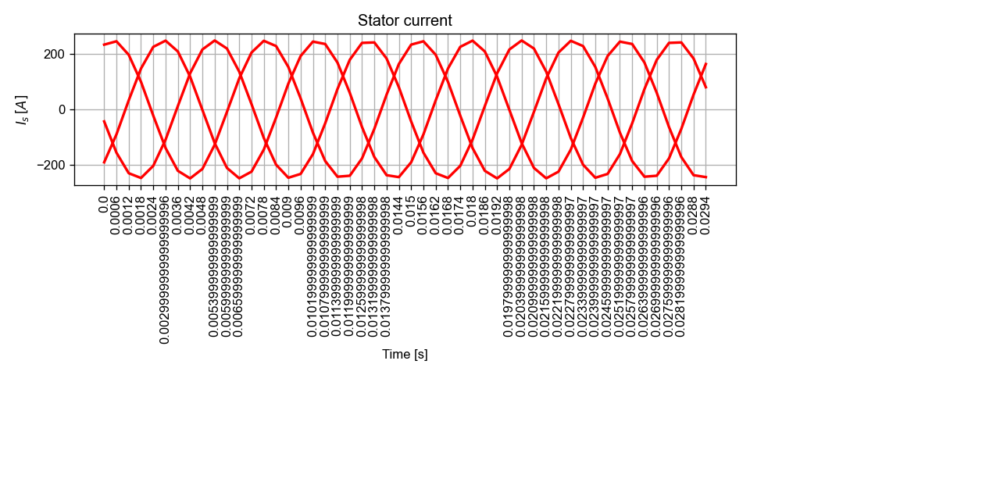

<IPython.core.display.Javascript object>


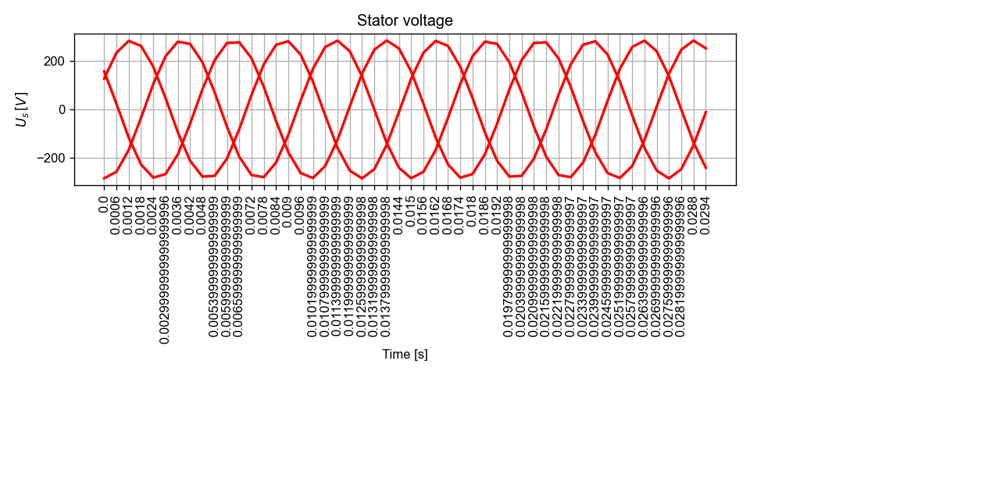

In [327]:
# Plot the currents
from pyleecan.Functions.Plot import dict_2D
out_elec.elec.get_Is().plot_2D_Data("time", "phase", **dict_2D)
out_elec.elec.get_Us().plot_2D_Data("time", "phase", **dict_2D)

## 여러 운영 지점에서 반복

다중 시뮬레이션은 "[동작점 설정 방법](https://pyleecan.org/tuto_Machine.html)"에서 설명한 것과 유사하지만, 이제 자기 토크 대신 전기 토크를 계산한다는 점만 다릅니다.
이전 부분에서와 같이 VarLoadCurrent를 사용하여 여러 작동 지점에서 전기 토크(자기 토크 대신)를 계산할 수 있습니다.

In [328]:
# Run multisimulation
simu_Velec = simu_elec.copy() # 고정 속도로 시뮬레이션 복사
simu_Velec.var_simu = varload.copy() # 이전 셀에서 계산된 varload 복사
simu_Velec.input.Nt_tot = 10   # 인덕턴스를 계산하기 위한 시간 단계 수
Xout_Velec = simu_Velec.run()


# Run multisimulation

#simu2 = simu_elec.copy()
#simu2.var_simu = varload
#Xout = simu2.run()

[13:34:06] Starting running simulation Webinar_1_elec (machine=Toyota_Prius)
[13:34:06] Reference Operating point is not in OP_matrix, one extra simulation will be computed
[13:34:06] Computing reference simulation for Variable Load
[13:34:06] Starting Electric module
[13:34:06] Variable Load Reference Results: N0=2000 [rpm], Id=-135.4 [Arms], Iq=113.6 [Arms], I0=176.8 [A], Phi0=2.443 [], Tem_av_ref=354 [N.m]
[======                                            ]  12%
[13:34:06] Running simulation 1/7 with N0=2000 [rpm], Id=88.39 [Arms], Iq=153.1 [Arms]
[13:34:06] Starting Electric module
[13:34:06] Variable Load Results: N0=2000 [rpm], Id=88.39 [Arms], Iq=153.1 [Arms], I0=176.8 [A], Phi0=1.047 [], Tem_av_ref=-284.5 [N.m]
[============                                      ]  25%
[13:34:06] Running simulation 2/7 with N0=2000 [rpm], Id=30.7 [Arms], Iq=174.1 [Arms]
[13:34:06] Starting Electric module
[13:34:06] Variable Load Results: N0=2000 [rpm], Id=30.7 [Arms], Iq=174.1 [Arms], I0=176.8

시뮬레이션이 완료되면 Phi0의 함수로서의 토크는 다음과 같이 표시될 수 있습니다.

C:\Users\KDH2018-PC\anaconda3\envs\py38_pyleecan_v1\lib\site-packages\scidatatool-1.4.25-py3.8.egg\SciDataTool\Functions\Plot\init_fig.py:37: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


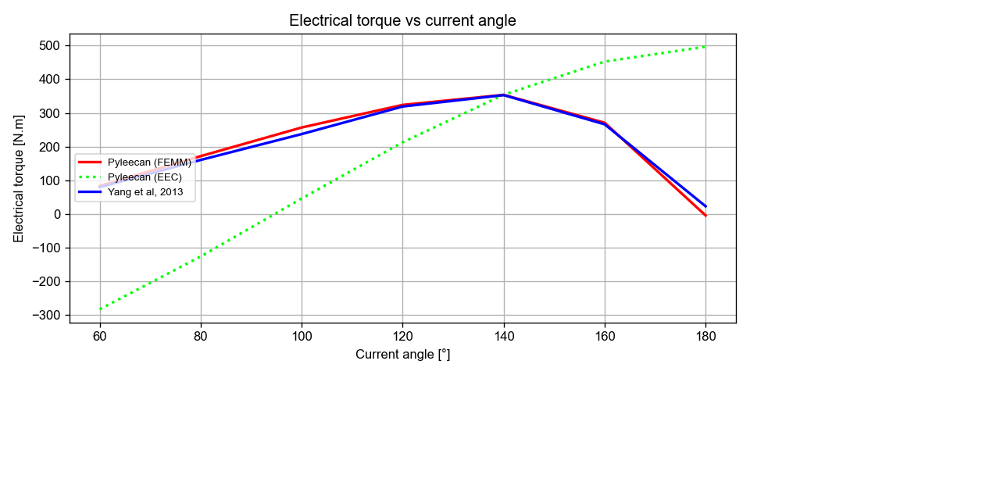

In [330]:
# from SciDataTool.Functions.Plot.plot_2D import plot_2D
from pyleecan.definitions import config_dict

# Plot torque as a function of Phi0
curve_colors = config_dict["PLOT"]["COLOR_DICT"]["CURVE_COLORS"]

try :    
    # 이전 자기 모델이 출시된 경우 오버레이 결과
    Ydatas = [Xout_vop.xoutput_dict["Tem_av"].result, Xout_Velec.xoutput_dict["Tem_av_ref"].result, Tem_av_ref[I_simu]]  
    legend_list = ["Pyleecan (FEMM)", "Pyleecan (EEC)", "Yang et al, 2013"]
    linestyle_list=["-","dotted","-"]
except :
    # EEC 토크 결과를 기준 토크와 비교
    Ydatas = [Xout_Velec.xoutput_dict["Tem_av_ref"].result, Tem_av_ref[I_simu]]
    legend_list=["Pyleecan", "Yang et al, 2013"]    
    linestyle_list=["-","-"]

ax = plot_2D(
    array([x*180/pi for x in Xout_Velec.xoutput_dict["Phi0"].result]),
    Ydatas,
    color_list=curve_colors,
    legend_list=legend_list,
    linestyle_list = linestyle_list,
    xlabel="Current angle [°]",
    ylabel="Electrical torque [N.m]",
    title="Electrical torque vs current angle"
)

[1] Z. Yang, M. Krishnamurthy and I. P. Brown, "Electromagnetic and vibrational characteristic of IPM over full torque-speed range", *2013 International Electric Machines & Drives Conference*, Chicago, IL, 2013, pp. 295-302.

[2] P. Bonneel, J. Le Besnerais, E. Devillers, C. Marinel, and R. Pile, “Design Optimization of Innovative Electrical Machines Topologies Based on Pyleecan Opensource Object-Oriented Software,” in 24th International Conference on Electrical Machines (ICEM), 2020.

[3] Z. Yang, M. Krishnamurthy and I. P. Brown, "Electromagnetic and vibrational characteristic of IPM over full torque-speed range," 2013 International Electric Machines & Drives Conference, Chicago, IL, 2013, pp. 295-302, doi: 10.1109/IEMDC.2013.6556267.